# Deliverable 1

Mark Maci

U30478693

# Key question to be answered:

## What are the patterns you see in  the rate of closure for the same type of service requests the same across NEIGHBORHOODS, CITY COUNCIL DISTRICTS, NEIGHBORHOOD SERVICES DISTRICT, ZIP CODE? 

To explore this question, we will be visualizing the geographic distribution of time-to-close among these geographic areas for the top 5 most common service request reasons. Each map will be a choropleth map, with the color of each area representing the closure time of the service request reason in that area. Each will have 5 layers, one for each of the top 5 service request reasons. By examining the maps, we can see if there are any patterns in the closure time of the same type of service request across different geographic areas.

In [28]:
import pandas as pd
import geopandas as gpd
import folium
from folium import Choropleth
import json

data_path = '../../data/2022.csv'
df = pd.read_csv(data_path, parse_dates=['open_dt', 'closed_dt'], low_memory=False)
df = df.dropna(subset=['closed_dt', 'open_dt', 'neighborhood', 'precinct', 'city_council_district', 'location_zipcode'])

neighborhood_gj_path = '../../data/geojson/Boston_Neighborhood_Boundaries_Approximated_by_2020_Census_Tracts.geojson'
neighborhood_geo_data = gpd.read_file(neighborhood_gj_path)

precinct_gj_path = '../../data/geojson/Boston_Precinct_Boundaries.geojson'
precinct_geo_data = gpd.read_file(precinct_gj_path)

city_council_gj_path = '../../data/geojson/City_Council_Districts_-_Current.geojson'
city_council_geo_data = gpd.read_file(city_council_gj_path)

zip_code_gj_path = '../../data/geojson/ZIP_Codes.geojson'
zip_code_geo_data = gpd.read_file(zip_code_gj_path)

reasons = df['reason'].value_counts().head(5).index.tolist()
print(reasons)


print(neighborhood_geo_data['neighborhood'].head().tolist())
print(precinct_geo_data['DISTRICT'].head().tolist())
print(city_council_geo_data['Councillor'].head().tolist())
print(zip_code_geo_data['ZIP5'].head().tolist())

['Enforcement & Abandoned Vehicles', 'Sanitation', 'Street Cleaning', 'Code Enforcement', 'Highway Maintenance']
['Allston', 'Back Bay', 'Beacon Hill', 'Brighton', 'Charlestown']
['01-01', '01-02', '01-03', '01-04', '01-05']
['Councillor LaMattina', 'Councillor Linehan', 'Councillor Baker', 'Councillor Campbell', 'Councillor McCarthy']
['02134', '02125', '02110', '02118', '02126']


# Closure Rate by Neighborhood

In [29]:
from branca.colormap import linear

def generate_neighborhood_map(df, neighborhood_geo_data, reasons):
    m = folium.Map(location=[42.3201, -71.0589], zoom_start=11.5)
    layers = {}

    for reason in reasons:
        reason_df = df[df['reason'] == reason].copy()
        reason_df['closure_time'] = (reason_df['closed_dt'] - reason_df['open_dt']).dt.days

        grouped_data = reason_df.groupby('neighborhood')['closure_time'].mean().reset_index()

        merged_data = neighborhood_geo_data.merge(grouped_data, left_on='neighborhood', right_on='neighborhood')

        merged_data['normalized_closure_time'] = (merged_data['closure_time'] - merged_data['closure_time'].min()) / (merged_data['closure_time'].max() - merged_data['closure_time'].min())

        colormap = linear.YlOrRd_09.scale(0, 1)

        style_function = lambda x: {
            'fillColor': colormap(x['properties']['normalized_closure_time']),
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.7
        }
    
        show_layer = (reason == reasons[0])
        layers[reason] = folium.GeoJson(
            merged_data,
            style_function=style_function,
            tooltip=folium.GeoJsonTooltip(
                fields=['neighborhood', 'closure_time'],
                aliases=['Neighborhood:', f'Avg. Closure Time for {reason}:'],
                localize=True,
            ),
            show=show_layer,
            name=reason
        ).add_to(m)

    folium.LayerControl().add_to(m)

    return m

m = generate_neighborhood_map(df, neighborhood_geo_data, reasons)

m

# Closure Rate by Precinct

In [30]:
def generate_precinct_map(df, precinct_geo_data, reasons):
    m = folium.Map(location=[42.3201, -71.0589], zoom_start=11.5)
    layers = {}

    for reason in reasons:
        reason_df = df[df['reason'] == reason].copy()
        reason_df['closure_time'] = (reason_df['closed_dt'] - reason_df['open_dt']).dt.days
        grouped_data = reason_df.groupby('precinct')['closure_time'].mean().reset_index()

        merged_data = precinct_geo_data.merge(grouped_data, left_on='WDPCT', right_on='precinct')

        if merged_data.empty:
            print(f"Merge failed for reason: {reason}")
            continue

        merged_data['normalized_closure_time'] = (merged_data['closure_time'] - merged_data['closure_time'].min()) / (merged_data['closure_time'].max() - merged_data['closure_time'].min())
        colormap = linear.YlOrRd_09.scale(0, 1)

        style_function = lambda x: {
            'fillColor': colormap(x['properties']['normalized_closure_time']),
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.7
        }

        show_layer = (reason == reasons[0])
        layers[reason] = folium.GeoJson(
            merged_data,
            style_function=style_function,
            tooltip=folium.GeoJsonTooltip(
                fields=['DISTRICT', 'closure_time'],
                aliases=['Precinct:', f'Avg. Closure Time for {reason}:'],
                localize=True,
            ),
            show=show_layer,
            name=reason
        ).add_to(m)

    folium.LayerControl().add_to(m)

    return m

m_precinct = generate_precinct_map(df, precinct_geo_data, reasons)
m_precinct


# Closure Rate by ZIP Code

In [31]:
def generate_zipcode_map(df, zip_code_geo_data, reasons):
    m = folium.Map(location=[42.3201, -71.0589], zoom_start=11.5)
    layers = {}

    df['location_zipcode'] = df['location_zipcode'].astype(str)

    df['location_zipcode'] = df['location_zipcode'].str.replace('.0$', '', regex=True)

    df['location_zipcode'] = df['location_zipcode'].str.zfill(5)

    zip_code_geo_data['ZIP5'] = zip_code_geo_data['ZIP5'].astype(str)


    for reason in reasons:
        reason_df = df[df['reason'] == reason].copy()
        reason_df['closure_time'] = (reason_df['closed_dt'] - reason_df['open_dt']).dt.days
        grouped_data = reason_df.groupby('location_zipcode')['closure_time'].mean().reset_index()

        merged_data = zip_code_geo_data.merge(grouped_data, left_on='ZIP5', right_on='location_zipcode')

        if merged_data.empty:
            print(f"Merge failed for reason: {reason}")
            continue

        merged_data['normalized_closure_time'] = (merged_data['closure_time'] - merged_data['closure_time'].min()) / (merged_data['closure_time'].max() - merged_data['closure_time'].min())
        colormap = linear.YlOrRd_09.scale(0, 1)

        style_function = lambda x: {
            'fillColor': colormap(x['properties']['normalized_closure_time']),
            'color': 'black',
            'weight': 2,
            'fillOpacity': 0.7
        }

        show_layer = (reason == reasons[0])
        layers[reason] = folium.GeoJson(
            merged_data,
            style_function=style_function,
            tooltip=folium.GeoJsonTooltip(
                fields=['ZIP5', 'closure_time'],
                aliases=['Zip Code:', f'Avg. Closure Time for {reason}:'],
                localize=True,
            ),
            show=show_layer,
            name=reason
        ).add_to(m)

    folium.LayerControl().add_to(m)

    return m

m_zipcode = generate_zipcode_map(df, zip_code_geo_data, reasons)
m_zipcode


# Visualizing Closure Rate Disparity by Percentile

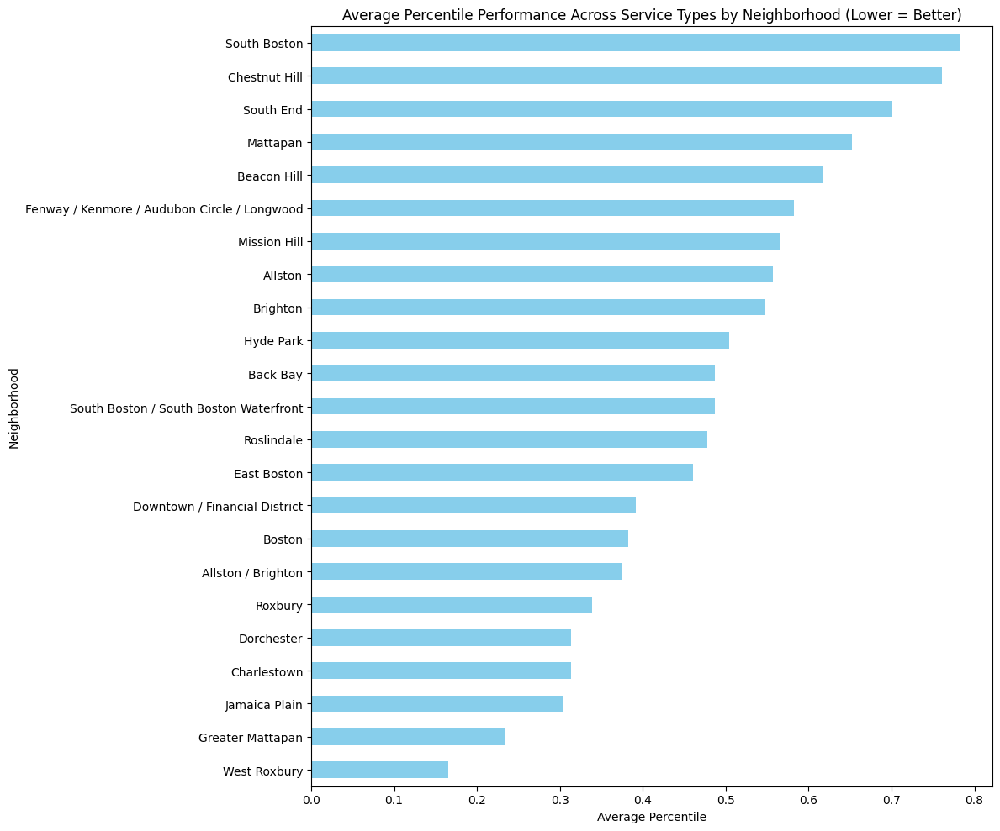

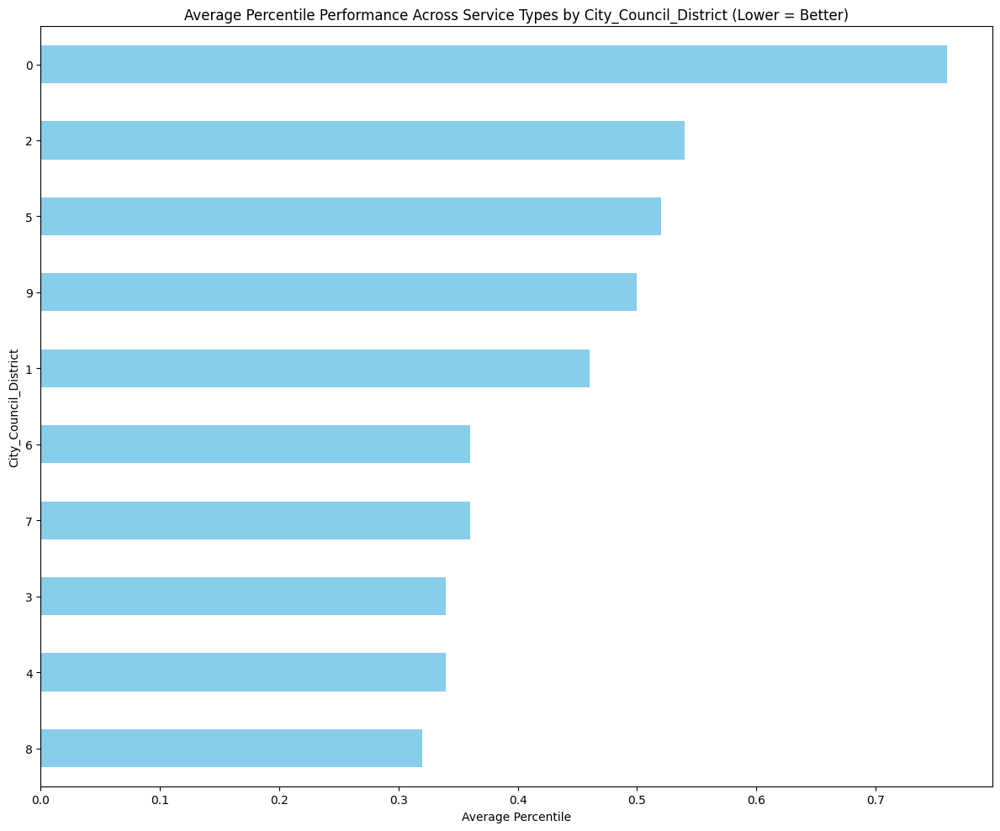

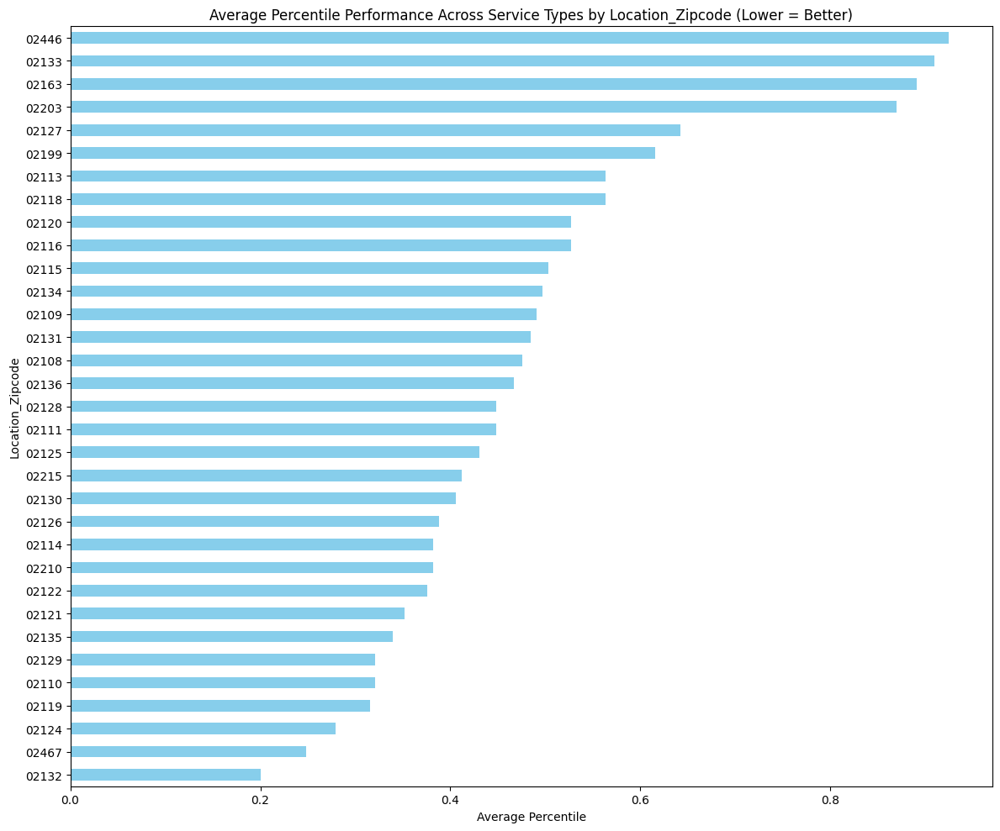

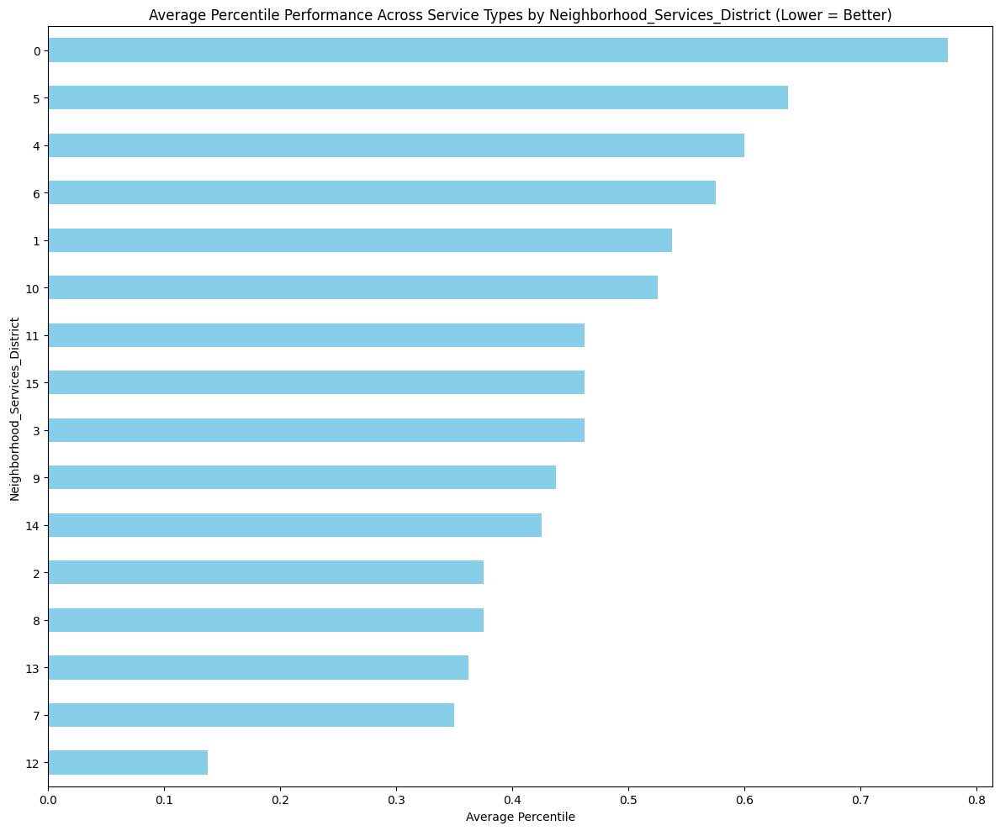

In [32]:
import matplotlib.pyplot as plt

categories = ['neighborhood', 'city_council_district', 'location_zipcode', 'neighborhood_services_district']

df['closure_time'] = (df['closed_dt'] - df['open_dt']).dt.days

for category in categories:
    grouped_data = df[df['reason'].isin(reasons)].groupby([category, 'reason'])['closure_time'].mean().unstack()

    for reason in reasons:
        min_value = grouped_data[reason].min()
        max_value = grouped_data[reason].max()
        grouped_data[f"{reason}_normalized"] = (grouped_data[reason] - min_value) / (max_value - min_value)

    for reason in reasons:
        grouped_data[f"{reason}_normalized"] = grouped_data[f"{reason}_normalized"].fillna(0)
        grouped_data[f"{reason}_percentile"] = grouped_data[f"{reason}_normalized"].rank(pct=True)

    grouped_data['average_percentile'] = grouped_data[[f"{reason}_percentile" for reason in reasons]].mean(axis=1)

    grouped_data_sorted = abs(1 - grouped_data.sort_values(by='average_percentile', ascending=True))

    # print(f"Best performing average open to close (service time) by {category}")
    # print(grouped_data_sorted.head(10))

    plt.figure(figsize=(12, 10))
    grouped_data_sorted['average_percentile'].plot(kind='barh', color='skyblue')
    plt.title(f'Average Percentile Performance Across Service Types by {category.title()} (Lower = Better)')
    plt.xlabel('Average Percentile')
    plt.ylabel(category.title())
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()


After analyzing the data, we can see distinguishable patterns in the closure time of the same type of service request across different geographic areas. Certain precincts of Roxbury, West Roxbury, and Jamaica Plain, especially precincts 19-08, 19-09 and 19-10 have much higher closure times for service requests relating to abandoned vehicles and sanitation. These types of disparities can be noticed in many regions and call reasons by layering the maps of service call types. This reflects what we see in the aggregated (all 5 reasons)analysis where these three neighborhoods rank among the bottom 6 in service percentiles. A hypothesis for why abandoned cars and trash are not being picked up in these at rates of other neighborhoods is that these neighborhoods are less affluent with public services already spread thin. 

Conversely, in the case of code enforcement, closure time varies much less across neighborhoods. This is likely because code enforcement is a more serious issue that is not as dependent on the resources of the neighborhood. An officer/public servant is most likely dispached to these calls ASAP, while sanitation and abandoned vehicles are less of a priority, especially in marginalized neighborhoods, regions, and zip codes. Sanitation map layers also show that the City of Boston is very keen on keeping its most tourist-heavy areas clean, as the precincts of Boston Common, the North End, and Fenway have the lowest closure times for sanitation calls. As you get further from these areas, closure time typically increases. 

While not a perfect picture of the city, these layered maps and subsequent aggregated graphs illustrate some overarching disparities between certain regions within Boston, as well as the city's priorities in terms of public services.